In [ ]:
# REFERENCING = YOLO11 citations

@software{yolo11_ultralytics,
  author = {Glenn Jocher and Jing Qiu},
  title = {Ultralytics YOLO11},
  version = {11.0.0},
  year = {2024},
  url = {https://github.com/ultralytics/ultralytics},
  orcid = {0000-0001-5950-6979, 0000-0002-7603-6750, 0000-0003-3783-7069},
  license = {AGPL-3.0}
}

# **Augmentation Complex + Lamda**

***Note:*** Avoid, as extra lines of code for the A.Lamda function is needed

In [ ]:
!pip install albumentations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import albumentations as A
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
import random
from albumentations.pytorch import ToTensorV2

In [ ]:
# Paths #

input_images_folder = "/content/drive/MyDrive/new_augmentation_personal/images/"
input_labels_folder = "/content/drive/MyDrive/new_augmentation_personal/labels/"

output_images_folder = "/content/drive/MyDrive/new_augmentation_personal/trial-3-augmented_images/"
output_labels_folder = "/content/drive/MyDrive/new_augmentation_personal/trial-3-augmented_labels/"

os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

image_paths = glob.glob(os.path.join(input_images_folder, "*.jpg"))

In [ ]:
# NEW AUGMENTATION PIPELINE - MORE TECHNIQUES & LAMBDA #

MICROBEAD_CLASS_ID = 10

def shrink_objects(image, keypoints, masks, bboxes):
  shrunk_keypoints, shrunk_masks, shrunk_bboxes = [], [], []

  for i, (kp, mask, bbox) in enumerate(zip(keypoints, masks, bboxes)):
    # Generate a random shrink factor per object (5% to 15%)
    shrink_factor = np.random.uniform(0.05, 0.15)

    # Compute new bounding box coordinates
    x_min, y_min, x_max, y_max = bbox
    width = (x_max - x_min) * shrink_factor
    height = (y_max - y_min) * shrink_factor

    # Keep the object centered while shrinking
    new_x_min = x_min + (x_max - x_min - width) / 2
    new_y_min = y_min + (y_max - y_min - height) / 2
    new_x_max = new_x_min + width
    new_y_max = new_y_min + height

    # Resize the segmentation mask
    mask_resized = cv2.resize(mask, None, fx=shrink_factor, fy=shrink_factor)

    # Apply same scaling to keypoints
    shrunk_kp = [(x * shrink_factor, y * shrink_factor) for (x, y) in kp]

    # Save transformed data
    shrunk_keypoints.append(shrunk_kp)
    shrunk_masks.append(mask_resized)
    shrunk_bboxes.append([new_x_min, new_y_min, new_x_max, new_y_max])

  return image, shrunk_keypoints, shrunk_masks, shrunk_bboxes

# Augmentation pipeline
final_transform = A.Compose([
  # Shape transformations (excluding microbeads)
  A.Affine(scale=(0.8, 1.2), rotate=(-15, 15), shear=(-10, 10), p=0.7),
  A.RandomScale(scale_limit=0.2, p=0.5),
  A.ElasticTransform(alpha=50, sigma=10, approximate=True, p=1.0),

  # Color transformations (applied to all objects)
  A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.7),
  A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1.0),

  # Background modifications (independent of object transformations)
  A.OneOf([
      A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1.0),
      A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.7),
  ], p=1.0),

  # Cutout augmentation
  A.CoarseDropout(max_holes=3, max_height=50, max_width=50, min_height=20, min_width=20, fill_value=0, p=0.5),

  # Shrink objects while keeping color and position
  A.Lambda(image=lambda img, **kwargs: img, p=1.0)  # Image remains unchanged here, shrink happens in preprocessing
])


<ipython-input-5-d78e57387310>:54: UserWarning: Argument(s) 'max_holes, max_height, max_width, min_height, min_width, fill_value' are not valid for transform CoarseDropout
  A.CoarseDropout(max_holes=3, max_height=50, max_width=50, min_height=20, min_width=20, fill_value=0, p=0.5),
<ipython-input-5-d78e57387310>:57: UserWarning: Using lambda is incompatible with multiprocessing. Consider using regular functions or partial().
  A.Lambda(image=lambda img, **kwargs: img, p=1.0)  # Image remains unchanged here, shrink happens in preprocessing


In [ ]:
for img_path in os.listdir(input_images_folder):
  #img = cv2.imread(img_path)
  #img_name = os.path.basename(img_path).split('.')[0]
  img_path = os.path.join(input_images_folder, img_path)  # Get full path
  #img = cv2.imread(img_path)
  print(img_path)
  #print(img_path[:-4])

/content/drive/MyDrive/new_augmentation_personal/images/20250314_161422_jpg.rf.b1aa2134df9373a9734350068b4366c3.jpg
/content/drive/MyDrive/new_augmentation_personal/images/20250314_145236_jpg.rf.c6913d09d5e978d58aed822280ae004f.jpg
/content/drive/MyDrive/new_augmentation_personal/images/20250314_155000_jpg.rf.b0a642b3b76964cfeda05695b977bace.jpg
/content/drive/MyDrive/new_augmentation_personal/images/20250314_160119_jpg.rf.ef885eb3e0b2f5fec3ceb4aad52b6be8.jpg
/content/drive/MyDrive/new_augmentation_personal/images/20250314_155325_jpg.rf.2150bedeb130c02bdf399b34a00c35f8.jpg
/content/drive/MyDrive/new_augmentation_personal/images/20250314_155321_jpg.rf.2fb9aae546aba0088641f5a9de5e7a4d.jpg
/content/drive/MyDrive/new_augmentation_personal/images/20250314_161227_jpg.rf.38f4f9133503be86766a249fe86e91d5.jpg
/content/drive/MyDrive/new_augmentation_personal/images/LDPE-2-4_jpg.rf.20e055480cc753c8de3e88ab81be2b2d.jpg
/content/drive/MyDrive/new_augmentation_personal/images/20250314_150626_jpg.rf.

In [ ]:
# Process each image in the input folder
#image_paths = glob.glob(os.path.join(input_images_folder, "*.jpg"))  # Change to your image format

for img_path in os.listdir(input_images_folder):
  img_path = os.path.join(input_images_folder, img_path)  # Get full path
  img = cv2.imread(img_path)
  img_name = img_path[:-4]

  # Load corresponding YOLO segmentation label
  label_path = os.path.join(input_labels_folder, img_name + ".txt")
  with open(label_path, "r") as f:
    lines = f.readlines()

  # Parse YOLO format labels (class_id, x_center, y_center, width, height)
  bboxes = []
  class_ids = []

  for line in lines:
    values = line.strip().split()
    class_id = int(values[0])

    if len(values) == 5:  # Bounding box format
      x_center, y_center, width, height = map(float, values[1:])
      x_min = x_center - width / 2
      y_min = y_center - height / 2
      x_max = x_center + width / 2
      y_max = y_center + height / 2
      bboxes.append([x_min, y_min, x_max, y_max])

    elif len(values) > 5:  # Segmentation mask format
      class_id = int(values[0])
      polygon = list(map(float, values[1:]))  # Convert all remaining values to float
      bboxes.append(polygon)  # Store polygon instead of bounding box
    class_ids.append(class_id)

  # Generate 20 augmented versions
  for i in range(20):
    aug_image, aug_masks, aug_bboxes = shrink_objects(img.copy(), [], bboxes)
    augmented = final_transform(image=aug_image)
    aug_image = augmented["image"]

    # Convert bboxes back to YOLO format
    yolo_bboxes = []
    for bbox, class_id in zip(aug_bboxes, class_ids):
      x_min, y_min, x_max, y_max = bbox
      x_center = (x_min + x_max) / 2
      y_center = (y_min + y_max) / 2
      width = x_max - x_min
      height = y_max - y_min
      yolo_bboxes.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")

    # Save the new image
    output_img_name = f"{img_name}_aug_{i}.jpg"
    output_label_name = f"{img_name}_aug_{i}.txt"
    cv2.imwrite(os.path.join(output_labels_folder, output_img_name), aug_image)

    # Save the updated label file
    with open(os.path.join(output_labelsfolder, output_label_name), "w") as f:
      f.write("\n".join(yolo_bboxes))

print("Augmentation completed. 20 versions per image saved!")

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/new_augmentation_personal/images/20250314_161422_jpg.rf.b1aa2134df9373a9734350068b4366c3.txt'

# **Augmentation Simple**

In [ ]:
!pip install albumentations opencv-python numpy matplotlib

In [ ]:
import albumentations as A
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import os

In [ ]:
# Augmentation pipeline #

MICROBEAD_CLASS_ID = 10

# Transforms for non microbead classes
shape_transform = A.Compose([
  A.Affine(scale=(0.01, 0.5), rotate=(-15, 15), shear=(-10, 10), p=1),
  A.RandomScale(scale_limit=0.7, p=0.8),
  A.ElasticTransform(alpha=50, sigma=10, alpha_affine=10, p=1.0),
  #A.Cutout(num_holes=8, max_h_size=32, max_w_size=32, fill_value=0, p=0.5),
  A.PiecewiseAffine(scale=(0.03, 0.05), p=0.5),
  A.GridDistortion(num_steps=5, distort_limit=0.3, p=0.5),
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.5),
  A.MotionBlur(blur_limit=7, p=0.5)],
  keypoint_params=A.KeypointParams(format="xy", remove_invisible=False))


# Transforms for all classes
color_transform = A.Compose([
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.7),    # double edge sword... will cause images to look green or red
    A.CLAHE(clip_limit=4.0, tile_grid_size=(8, 8), p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=1.0)])

# for segmentation polygons in labels file
keypoint_params = A.KeypointParams(format="xy", remove_invisible=False)

<ipython-input-17-e37887ca26ee>:9: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(alpha=50, sigma=10, alpha_affine=10, p=1.0),
/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:87: UserWarning: This augmenter is very slow. Try to use ``ElasticTransform`` instead, which is at least 10x faster.
  original_init(self, **validated_kwargs)
<ipython-input-17-e37887ca26ee>:13: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.5),


In [ ]:
# Paths #

input_images_folder = "/content/drive/MyDrive/new_augmentation_personal/images/"
input_labels_folder = "/content/drive/MyDrive/new_augmentation_personal/labels/"

output_images_folder = "/content/drive/MyDrive/new_augmentation_personal/images/trial-2-augmented_images/"
output_labels_folder = "/content/drive/MyDrive/new_augmentation_personal/labels/trial-2-augmented_labels/"

os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

image_paths = glob.glob(os.path.join(input_images_folder, "*.jpg"))

In [ ]:
# BATCH AUGMENTATION #

for img_path in os.listdir(input_images_folder):
  img_name = os.path.basename(img_path)
  label_path = os.path.join(input_labels_folder, img_name.replace(".jpg", ".txt"))

  # Read image
  image = cv2.imread(img_path)
  height, width, _ = image.shape

  # Read YOLOv8 segmentation label file
  polygons = []
  class_labels = []
  with open(label_path, "r") as f:
    for line in f.readlines():
      values = line.strip().split()
      class_id = int(values[0])
      polygon = list(map(float, values[1:]))  # Polygon coordinates (x1, y1, x2, y2, ...)

      # Convert normalized values back to pixel coordinates
      if len(polygon) % 2 == 0:  # Ensure pairs of (x, y) exist
        polygon = [(polygon[i] * width, polygon[i+1] * height) for i in range(0, len(polygon), 2)]
        polygons.append(polygon)
        class_labels.append(class_id)

  for i in range(20):  # Generate 20 augmentations per image
    # Separate 'microbead' from other objects
    non_microbead_polygons = [poly for poly, cls in zip(polygons, class_labels) if cls != MICROBEAD_CLASS_ID]
    microbead_polygons = [poly for poly, cls in zip(polygons, class_labels) if cls == MICROBEAD_CLASS_ID]
    non_microbead_labels = [cls for cls in class_labels if cls != MICROBEAD_CLASS_ID]
    microbead_labels = [cls for cls in class_labels if cls == MICROBEAD_CLASS_ID]

    # Apply shape transformation only to non-microbead objects
    if non_microbead_polygons:
      keypoints_flat = [pt for poly in non_microbead_polygons for pt in poly]  # Flatten polygons
      augmented_non_microbead = shape_transform(image=image, keypoints=keypoints_flat)
      image_aug, keypoints_non_microbead = augmented_non_microbead["image"], augmented_non_microbead["keypoints"]

      # Reconstruct transformed non-microbead polygons
      aug_polygons_non_microbead = []
      idx = 0
      for poly in non_microbead_polygons:
          aug_polygons_non_microbead.append(keypoints_non_microbead[idx:idx+len(poly)])
          idx += len(poly)
    else:
      image_aug = image.copy()
      aug_polygons_non_microbead = []

    # Apply brightness/contrast transformations (to entire image)
    image_aug = color_transform(image=image_aug)["image"]

    # Microbead class polygons remain unchanged
    aug_polygons_microbead = microbead_polygons

    # Combine transformed and untransformed polygons
    final_aug_polygons = aug_polygons_non_microbead + aug_polygons_microbead
    final_aug_labels = non_microbead_labels + microbead_labels

    # Ensure there's at least one valid polygon before saving
    if final_aug_polygons:
      # Save augmented image
      aug_img_name = f"{os.path.splitext(img_name)[0]}_aug_{i}.jpg"
      cv2.imwrite(os.path.join(output_images_folder, aug_img_name), image_aug)

      # Save augmented labels in YOLOv8 segmentation format
      aug_label_path = os.path.join(output_labels_folder, aug_img_name.replace(".jpg", ".txt"))
      with open(aug_label_path, "w") as f:
        for cls, aug_poly in zip(final_aug_labels, final_aug_polygons):
          if len(aug_poly) > 0:  # Prevent empty polygons
            norm_poly = np.array(aug_poly).flatten()
            norm_poly = [str(coord / width if j % 2 == 0 else coord / height) for j, coord in enumerate(norm_poly)]
            f.write(f"{cls} {' '.join(norm_poly)}\n")

print("Batch augmentation with YOLOv8 segmentation complete! Microbead class excluded from shape modifications.")

AttributeError: 'NoneType' object has no attribute 'shape'

# **Basic YOLOv11 Model Training**

In [ ]:
# Install Ultralytics YOLO
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 76.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 63.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
from google.colab import drive
#drive.flush_and_unmount()
drive.mount('/content/drive')

ValueError: Mountpoint must not already contain files

In [ ]:
# Verify installation
import ultralytics
ultralytics.checks()

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.1/112.6 GB disk)


In [ ]:
# NOTE: mount google drive first ie. click 3rd button counting from left in the Files sidebar

dataset_yaml = """

train: /C:/Users/mingm/OneDrive/Desktop/GILLIAN/train
val: /C:/Users/mingm/OneDrive/Desktop/GILLIAN/validation
test: /C:/Users/mingm/OneDrive/Desktop/GILLIAN/test

nc: 12
names: ['HDPE', 'LDPE', 'PET', 'PMMA', 'PP', 'PS', 'PVC', 'cigarette butt', 'grass', 'microbead', 'plastic net', 'polyester']

roboflow:
  workspace: final-year-project
  project: combo-model-segmentation
  version: 6
  license: CC BY 4.0
  url: https://universe.roboflow.com/final-year-project-microplastics-in-urban-water-runoff/combo-model-segmentation/dataset/6

# Data augmentations
augment: true
hsv_h: 0.015  # Hue adjustment (simulate fluorescence intensity variation)
hsv_s: 0.7    # Saturation adjustment (boost fluorescence color)
hsv_v: 0.4    # Brightness adjustment (different lighting conditions)
flipud: 0.5   # Flip images upside down (for orientation robustness)
fliplr: 0.5   # Flip images left-right
mosaic: 1.0   # Enable mosaic augmentation
mixup: 0.7    # Enable mixup augmentation

"""

with open("dataset.yaml", "w") as file:
    file.write(dataset_yaml)


In [ ]:
from ultralytics import YOLO

# Load YOLO instance segmentation model "yolo11m-seg.pt" or object detection model that can be used with SAHI "yolo11m.pt"
model = YOLO("yolo11m-seg.pt")

#model = YOLO("/content/trial 1 - best_weights_model_YOLO11m-seg.pt")

# Train the model with augmentations
model.train(data="dataset.yaml", epochs=50, imgsz=1280, batch=16, amp=True)
model.save('version_1_weights.pt')

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11m-seg.pt, data=dataset.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

100%|██████████| 755k/755k [00:00<00:00, 22.5MB/s]


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 97.8MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/train/labels... 929 images, 63 backgrounds, 300 corrupt: 100%|██████████| 952/952 [06:56<00:00,  2.29it/s]

train: WARNING ⚠️ /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/train/images/20250220_153843_jpg.rf.313c8bb720700b431a061189ad0edb20.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/train/images/20250220_155259_jpg.rf.599caed0f331cfa70cefc5c73ff791ac.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/train/images/20250220_155908_jpg.rf.c5b557076a211c23ceb9ff118f78f626.jpg: 1 duplicate labels removed
train: WARNING ⚠️ /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/train/images/20250220_160118_jpg.rf.1f1fa8eb0a0b0dd9781067651efa291d.jpg: 1 duplicate labels removed
train: WARNI

train: New cache created: /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/valid/labels... 10 images, 1 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:13<00:00,  1.34s/it]

val: New cache created: /content/drive/MyDrive/405-combo model segmentation.v12i.yolov11-20250322T142340Z-001/405-combo model segmentation.v12i.yolov11/valid/labels.cache


Plotting labels to runs/segment/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 115 weight(decay=0.0), 126 weight(decay=0.0005), 125 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1280 train, 1280 val
Using 2 dataloader workers
Logging results to runs/segment/train3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/41 [00:00<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 100.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 52.12 MiB is free. Process 6459 has 14.69 GiB memory in use. Of the allocated memory 14.42 GiB is allocated by PyTorch, and 117.65 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [ ]:
### Empty cache ###

import torch
torch.cuda.empty_cache()

In [ ]:
# Evaluate model on validation set
metrics = model.val()

metrics.confusion_matrix  # Confusion matrix
metrics.results_dict      # Dictionary containing all evaluation results
metrics.save_txt          # Save results in a text file

Ultralytics 8.3.88 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,039,284 parameters, 0 gradients, 67.7 GFLOPs


val: Scanning /content/drive/MyDrive/images 305 combo model segmentation.v6i.yolov11/valid/labels.cache... 10 images, 1 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


                   all         10         51      0.388      0.658      0.601      0.471
                  HDPE          2         18      0.904      0.833       0.96      0.745
                  LDPE          3          9      0.457      0.778      0.587      0.463
                   PET          1          3      0.277      0.901      0.365      0.343
                    PP          2          4      0.564          1      0.995       0.81
                    PS          1         11      0.432          1      0.917      0.777
                   PVC          1          1          0          0     0.0415     0.0124
         aired PS wrap          1          4      0.469       0.75      0.691      0.533
        cigarette butt          1          1          0          0      0.249     0.0875
Speed: 0.3ms preprocess, 34.6ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train2


# **Testing**


image 1/1 /content/beast-image-testing.jpg: 640x480 5 HDPEs, 1 LDPE, 2 PETs, 1 PP, 1 PS, 1 aired PS wrap, 2 cigarette butts, 1 grass, 4 microbeads, 1 polyester, 1546.1ms
Speed: 4.1ms preprocess, 1546.1ms inference, 68.6ms postprocess per image at shape (1, 3, 640, 480)


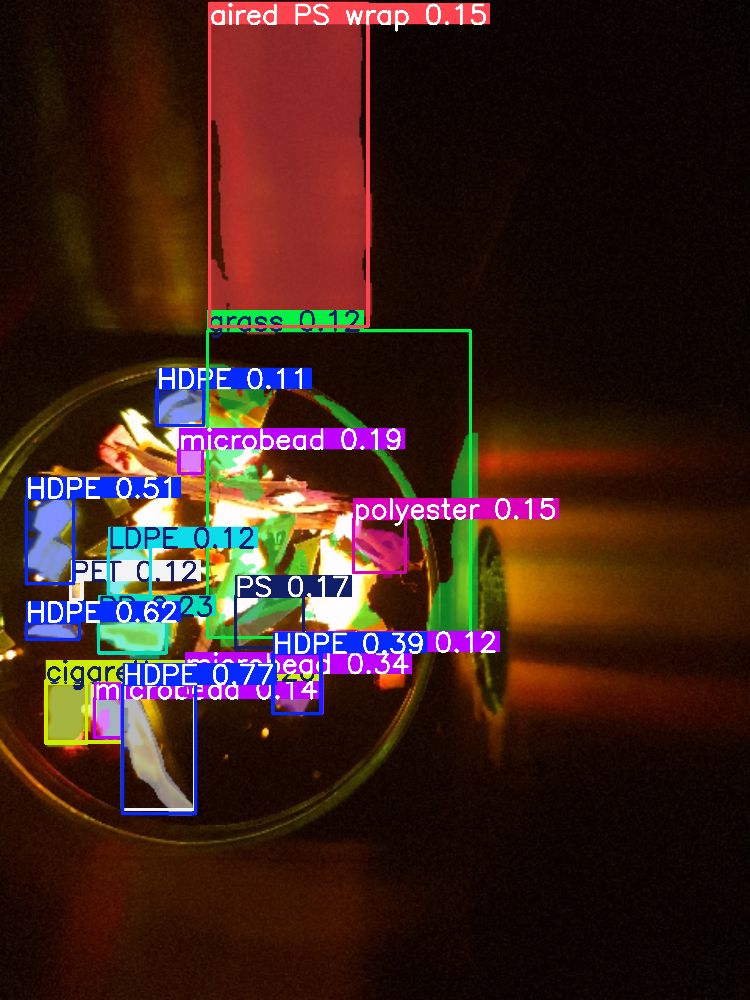

In [ ]:
results = model("/content/beast-image-testing.jpg", conf = 0.1)    # path to testing image # default confidence level is 0.5
results[0].show()


In [ ]:
# See a List of Predictions and Bounding Box Coordinates
results = model("/content/beast-image-testing.jpg")

# Get detections from the first result (assuming single image)
detections = results[0].boxes  # Bounding boxes

for box in detections:
    xyxy = box.xyxy.cpu().numpy()[0]  # [x_min, y_min, x_max, y_max]
    conf = box.conf.cpu().numpy()[0]  # Confidence score
    cls = int(box.cls.cpu().numpy()[0])  # Class label (integer)

    print(f"Class: {cls}, Confidence: {conf:.01f}, BBox: {xyxy}")


image 1/1 /content/beast-image-testing.jpg: 640x480 4 HDPEs, 1 PS, 1 cigarette butt, 28.5ms
Speed: 4.9ms preprocess, 28.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 480)
Class: 0, Confidence: 0.8, BBox: [     497.33      2780.5      794.93      3308.9]
Class: 0, Confidence: 0.7, BBox: [     1116.1      2663.7      1311.9      2911.7]
Class: 0, Confidence: 0.5, BBox: [     107.71      2032.1      303.46      2380.7]
Class: 0, Confidence: 0.5, BBox: [     636.79      1587.9      848.37      1733.1]
Class: 7, Confidence: 0.4, BBox: [     190.84      2782.1       456.5        3032]
Class: 4, Confidence: 0.4, BBox: [     495.16      2778.2      794.39      3311.8]


In [ ]:
# Define the Certain Class of Labels only
target_class = 9

# Filter detections for a specific class
filtered_boxes = [box for box in detections if int(box.cls.cpu().numpy()[0]) == target_class]

# Print results for the selected class only
for box in filtered_boxes:
    xyxy = box.xyxy.cpu().numpy()[0]  # Bounding box
    conf = box.conf.cpu().numpy()[0]  # Confidence
    print(f"Class: {target_class}, Confidence: {conf:.01f}, BBox: {xyxy}")

In [ ]:
import cv2

# Load image
image_path = "/content/beast-image-testing.jpg"
img = cv2.imread(image_path)

# Draw bounding boxes for the specific class
for box in filtered_boxes:
    xyxy = box.xyxy.numpy()[0]
    conf = box.conf.numpy()[0]

    # Convert to integers
    x1, y1, x2, y2 = map(int, xyxy)

    # Draw bounding box
    cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

    # Put confidence label
    cv2.putText(img, f"{conf:.01f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Save output
cv2.imwrite("filtered_testing_output.jpg", img)

True

# **Model Usage YOLOv11m-seg**

In [ ]:
!pip install Ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 974.5/974.5 kB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 33.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 29.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 42.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall


image 1/1 /content/NM1_PXL_20250325_152417276.NIGHT.jpg: 1248x1280 3 HDPEs, 2 LDPEs, 1 PP, 6 microbeads, 13 plastic nets, 13525.6ms
Speed: 28.2ms preprocess, 13525.6ms inference, 548.1ms postprocess per image at shape (1, 3, 1248, 1280)


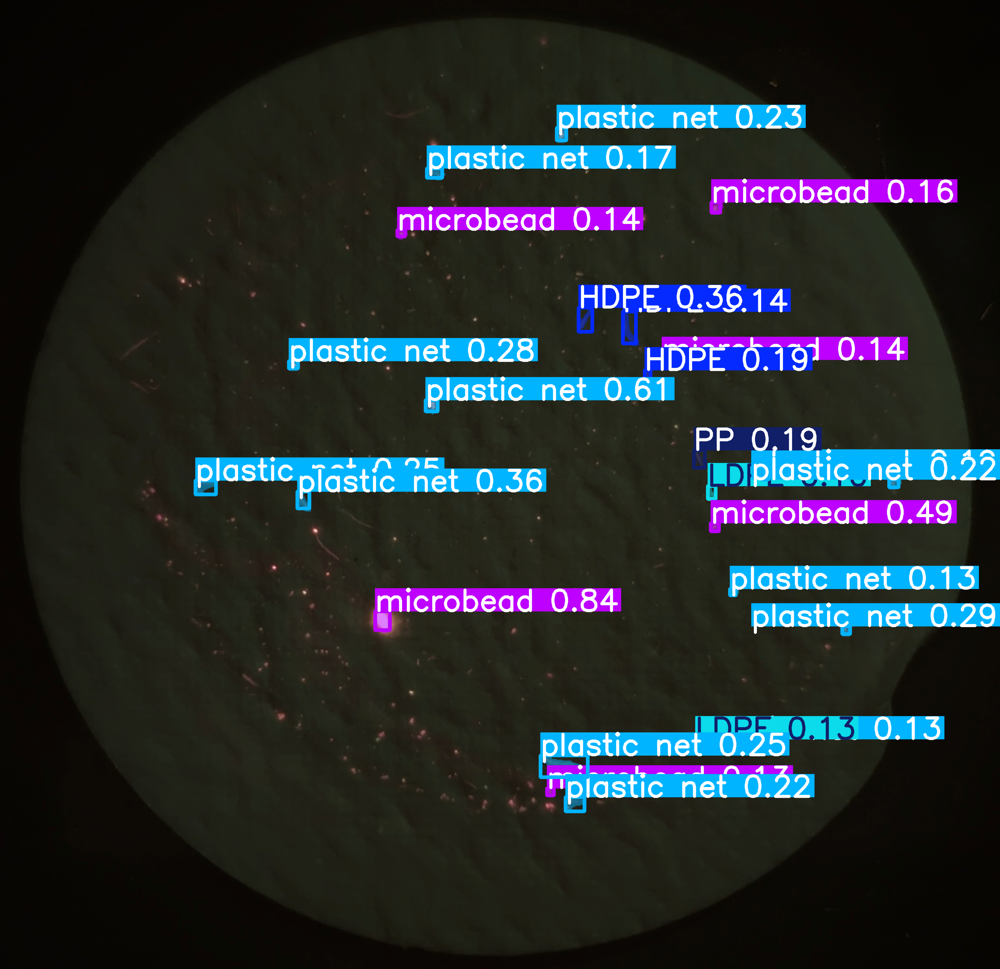

None
           xmin         ymin         xmax         ymax  confidence  class  \
0   1152.309692  1878.913818  1197.034546  1936.916626    0.836588    9.0   
1   1307.848877  1229.026245  1344.101440  1264.389282    0.611222   10.0   
2   2183.332031  1607.309570  2208.343994  1632.925537    0.485561    9.0   
3    913.821106  1510.259521   950.171509  1562.847412    0.364737   10.0   
4   1777.269653   945.508057  1819.784424  1019.420837    0.360564    0.0   
5   2587.344971  1924.701294  2611.516113  1948.019043    0.286092   10.0   
6    887.194336  1109.548218   915.091553  1132.238525    0.275576   10.0   
7   1660.785645  2321.870361  1805.383301  2388.109863    0.250457   10.0   
8    600.330200  1476.771362   663.186646  1519.195068    0.247847   10.0   
9   1710.065186   392.872070  1739.026978   431.388519    0.229113   10.0   
10  1737.318848  2449.492676  1795.953003  2493.101807    0.217525   10.0   
11  2731.758545  1473.935425  2760.881836  1497.109253    0.215717   10

In [ ]:
from ultralytics import YOLO

# Load your trained YOLO model
model = YOLO("/content/best.pt")   # .pt file of custom weights is the YOLO model


###################################### TESTING MODEL ######################################
results = model("/content/NM1_PXL_20250325_152417276.NIGHT.jpg", conf=0.1)
print(results[0].show())


################### TABULAR DATA OF OUTPUT - xmin, ymin, xmax, ymax coordinates, confidence, class ID, corresponding class name ###################
import pandas as pd
detections = results[0].boxes.data  # Access detection data

# Optionally, map class IDs to class names if you have them
class_names = {0: 'HDPE', 1: 'LDPE', 2: 'PET', 3: 'PMMA', 4: 'PP', 5: 'PS', 6: 'PVC', 7: 'cigarette butt', 8: 'grass', 9: 'microbead', 10: 'plastic net', 11: 'polyester'}  # Replace with your class names

# Create a Pandas DataFrame
df = pd.DataFrame(detections.cpu().numpy(), columns=['xmin', 'ymin', 'xmax', 'ymax', 'confidence', 'class'])

df['class_name'] = df['class'].map(class_names)

# Display the DataFrame
print(df)

df.to_csv('tabular_information_output.csv', index=False)

# **Using YOLO11m-seg + SAHI (function maths)**

link: https://blog.roboflow.com/how-to-use-sahi-to-detect-small-objects/

In [ ]:
!pip install inference inference-sdk
!pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 4.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 42.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 32.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.4/243.4 kB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 5.0 MB/s eta 0:00

In [ ]:
import ultralytics
import supervision as sv
import numpy as np
import cv2
#from inference import get_roboflow_model
from ultralytics import YOLO

# Load testing image

image_file = "/content/NM1_PXL_20250325_152417276.NIGHT.jpg"
image = cv2.imread(image_file)

# Using model trained by Roboflow // Replace with own model trained here ??
# model = get_roboflow_model(model_id="people-detection-general/5", api_key="API_KEY")

model = YOLO("best1280.pt")   # .pt file of custom weights is the YOLO model

def callback(image_slice: np.ndarray) -> sv.Detections:
    results = model.predict(image_slice)[0]
    # Check if results.boxes is empty
    if results.boxes.shape[0] == 0:
        # Handle the case where no predictions were made
        return sv.Detections(
            xyxy=np.empty((0, 4)),
            confidence=np.empty((0,)),
            class_id=np.empty((0,), dtype=int)
        )
    # Access detection data (xyxy, confidence, and class)
    xyxy = results.boxes.xyxy.cpu().numpy()
    confidence = results.boxes.conf.cpu().numpy()
    class_id = results.boxes.cls.cpu().numpy().astype(int)

    # Create Detections object
    detections = sv.Detections(
        xyxy=xyxy,
        confidence=confidence,
        class_id=class_id
    )
    return detections

# Using SAHI slicer
slicer = sv.InferenceSlicer(callback=callback)
sliced_detections = slicer(image=image)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


SupervisionWarnings: `overlap_ratio_wh` in `InferenceSlicer.__init__` is deprecated and will be removed in `supervision-0.27.0`. Please manually set it to `None` and use `overlap_wh` instead.



0: 1280x1280 (no detections), 10604.5ms
Speed: 41.6ms preprocess, 10604.5ms inference, 9.9ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 10367.3ms
Speed: 14.6ms preprocess, 10367.3ms inference, 1.4ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 10506.8ms
Speed: 14.0ms preprocess, 10506.8ms inference, 1.2ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 9867.8ms
Speed: 15.7ms preprocess, 9867.8ms inference, 1.5ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 9974.4ms
Speed: 20.4ms preprocess, 9974.4ms inference, 1.2ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 11921.4ms
Speed: 14.3ms preprocess, 11921.4ms inference, 1.2ms postprocess per image at shape (1, 3, 1280, 1280)

0: 1280x1280 (no detections), 11812.2ms
Speed: 17.5ms preprocess, 11812.2ms inference, 1.2ms postprocess per image at shape (1, 3, 1280, 12

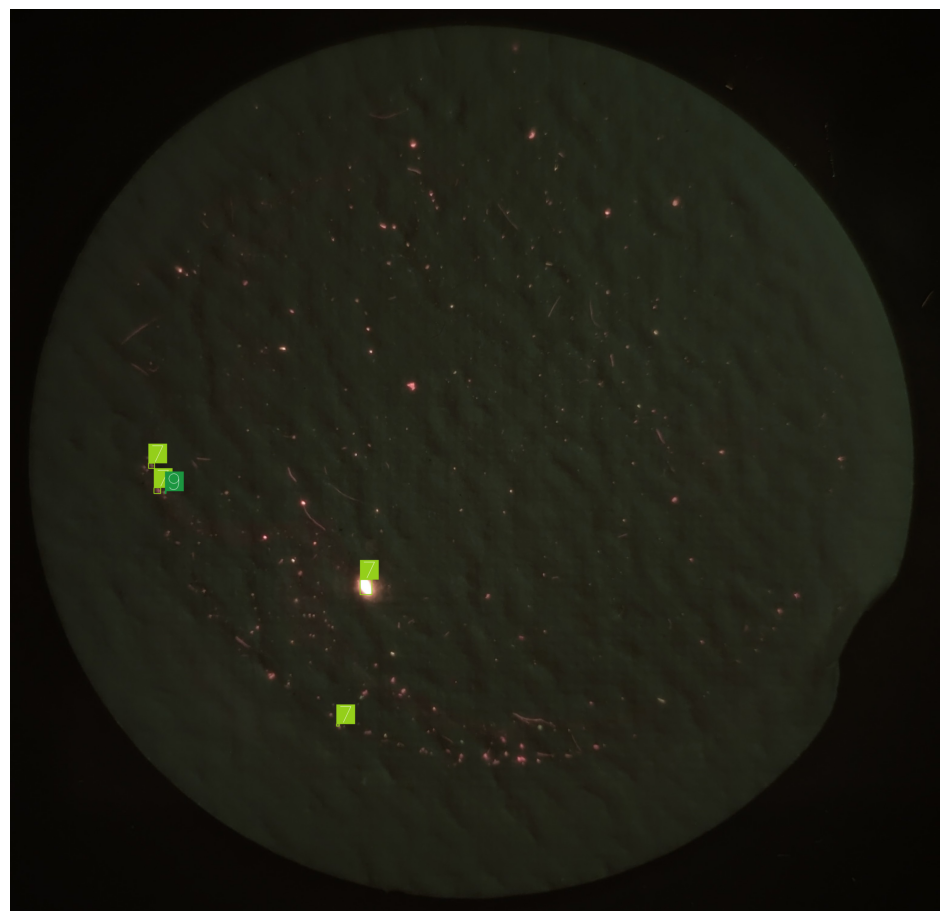

In [ ]:
import supervision as sv

# Load class names for bounding box labels
CLASS_NAMES = ['HDPE', 'LDPE', 'PET', 'PP', 'PS', 'PVC', 'aired PS wrap',
               'cigarette butt', 'grass', 'microbead', 'plastic net', 'polyester']

# Convert class IDs to class names
sliced_detections.class_names = [CLASS_NAMES[int(class_id)] for class_id in sliced_detections.class_id]

# Initialize annotators
label_annotator = sv.LabelAnnotator(text_scale=2.5, text_padding=5)
box_annotator = sv.BoxAnnotator()

# Annotate image with bounding boxes and labels
annotated_image = box_annotator.annotate(scene=image.copy(), detections=sliced_detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=sliced_detections)

# Show the final image with labels
sv.plot_image(annotated_image)


# **SAHI + YOLOv11**

In [ ]:
# Install necessary libraries
!pip install sahi>=0.13.0

!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118 # Adjust cu118 based on your Colab GPU



In [ ]:
# Import necessary libraries
import sahi
from sahi.models import yolov5
from sahi.predict import get_sliced_prediction
from sahi.utils.cv import visualise_sliced_predictions
from PIL import Image
import matplotlib.pyplot as plt


ImportError: cannot import name 'visualise_sliced_predictions' from 'sahi.utils.cv' (/usr/local/lib/python3.11/dist-packages/sahi/utils/cv.py)

In [ ]:

# Import necessary libraries
from sahi.models import Yolov8SegmentationModel
from sahi.predict import get_sliced_prediction
from sahi.utils.cv import visualize_sliced_predictions
from PIL import Image
import matplotlib.pyplot as plt

# --- 1. Define Model Parameters ---
# Replace 'path/to/your/best.pt' with the actual path to your YOLOv8 model file
model_path = 'path/to/your/best.pt'
# Replace with the desired confidence threshold
confidence_threshold = 0.5
# Replace with the desired IoU threshold for non-maximum suppression
iou_threshold = 0.45
# Specify the device to use ('cpu' or 'cuda')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# --- 2. Load YOLOv8 Segmentation Model with SAHI ---
yolov8_model = Yolov8SegmentationModel(
    model_path=model_path,
    confidence_threshold=confidence_threshold,
    iou_threshold=iou_threshold,
    device=device
)

# --- 3. Define Input Image Path ---
# Replace 'path/to/your/image.jpg' with the actual path to your input image
image_path = 'path/to/your/image.jpg'

# --- 4. Perform Sliced Inference ---
# Configure slicing parameters (optional, but recommended for larger images)
slice_height = 512
slice_width = 512
overlap_height_ratio = 0.2
overlap_width_ratio = 0.2

# Get sliced predictions
result = get_sliced_prediction(
    image_path,
    yolov8_model,
    slice_height=slice_height,
    slice_width=slice_width,
    overlap_height_ratio=overlap_height_ratio,
    overlap_width_ratio=overlap_width_ratio
)

# --- 5. Visualize Predictions ---
# Convert SAHI predictions to a format that can be visualized
object_predictions = result.object_prediction_list

# Load the original image using PIL
image = Image.open(image_path).convert("RGB")

# Visualize the predictions on the image
visualized_image = visualize_sliced_predictions(
    image,
    object_predictions,
    show_masks=False, # Set to True if you want to visualize masks as well
    show_confidences=True,
    show_class_names=True
)

# --- 6. Display the Output Image in Colab ---
plt.figure(figsize=(12, 12))
plt.imshow(visualized_image)
plt.axis('off')
plt.show()

# --- 7. Save the Output Image (Optional) ---
output_image_path = 'output_image_with_predictions.jpg'
visualized_image.save(output_image_path)
print(f"Output image saved to: {output_image_path}")

Looking in indexes: https://download.pytorch.org/whl/cu118


ModuleNotFoundError: No module named 'sahi.model'